__1. Loading the Dataset__

In [1]:
import pandas as pd

# Load the training data
train_data = pd.read_csv('train_data.txt', sep=' ::: ', header=None, engine='python', names=['ID', 'TITLE', 'GENRE', 'DESCRIPTION'])

# Load the test data (without genres)
test_data = pd.read_csv('test_data.txt', sep=' ::: ', header=None, engine='python', names=['ID', 'TITLE', 'DESCRIPTION'])

In [2]:
train_data.head()

,ID,TITLE,GENRE,DESCRIPTION
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his doc...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous re...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fiel...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends meet...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-rec...


__2. Text Preprocessing__

In [3]:
import nltk
from nltk.corpus import stopwords
import re

In [4]:
nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to C:\Users\KRITIKA
[nltk_data]     SINGH\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [5]:
# Function for cleaning the text
def preprocess_text(text):
    # Lowercase
    text = text.lower()
    # Remove special characters and digits
    text = re.sub(r'[^a-z\s]', '', text)
    # Remove stopwords
    words = [word for word in text.split() if word not in stop_words]
    return ' '.join(words)

In [6]:
# Apply preprocessing to the training and test data
train_data['DESCRIPTION'] = train_data['DESCRIPTION'].apply(preprocess_text)
test_data['DESCRIPTION'] = test_data['DESCRIPTION'].apply(preprocess_text)

train_data['DESCRIPTION'].head() 

0    listening conversation doctor parents yearold ...
1    brother sister past incestuous relationship cu...
2    bus empties students field trip museum natural...
3    help unemployed father make ends meet edith tw...
4    films title refers unrecovered bodies ground z...
Name: DESCRIPTION, dtype: object

__3. Exploratory Data Analysis (EDA) & Visualizations__

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

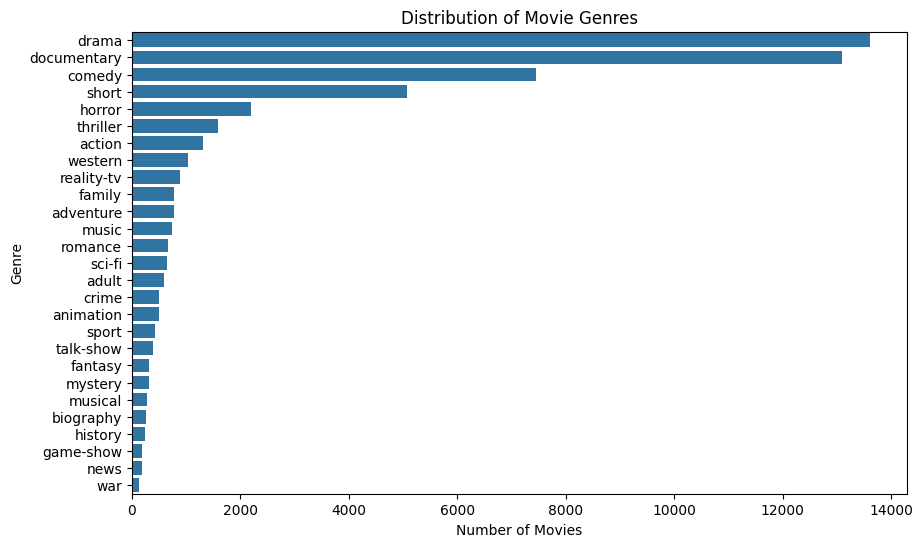

In [8]:
plt.figure(figsize=(10,6))
sns.countplot(y='GENRE', data=train_data, order=train_data['GENRE'].value_counts().index)
plt.title('Distribution of Movie Genres')
plt.xlabel('Number of Movies')
plt.ylabel('Genre')
plt.show()

__4. Feature Extraction (TF-IDF)__

In [9]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [10]:
tfidf = TfidfVectorizer(max_features=5000)
X_train_tfidf = tfidf.fit_transform(train_data['DESCRIPTION'])

X_test_tfidf = tfidf.transform(test_data['DESCRIPTION'])

print(X_train_tfidf.shape, X_test_tfidf.shape)

(54214, 5000) (54200, 5000)


__5. Model Building__

* Logistic Regression

In [11]:
from sklearn.linear_model import LogisticRegression

X_train = X_train_tfidf
y_train = train_data['GENRE']

model = LogisticRegression(max_iter=1000)

model.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

__6. Model Evaluation & Visualizations__

Validation Accuracy: 57.81%


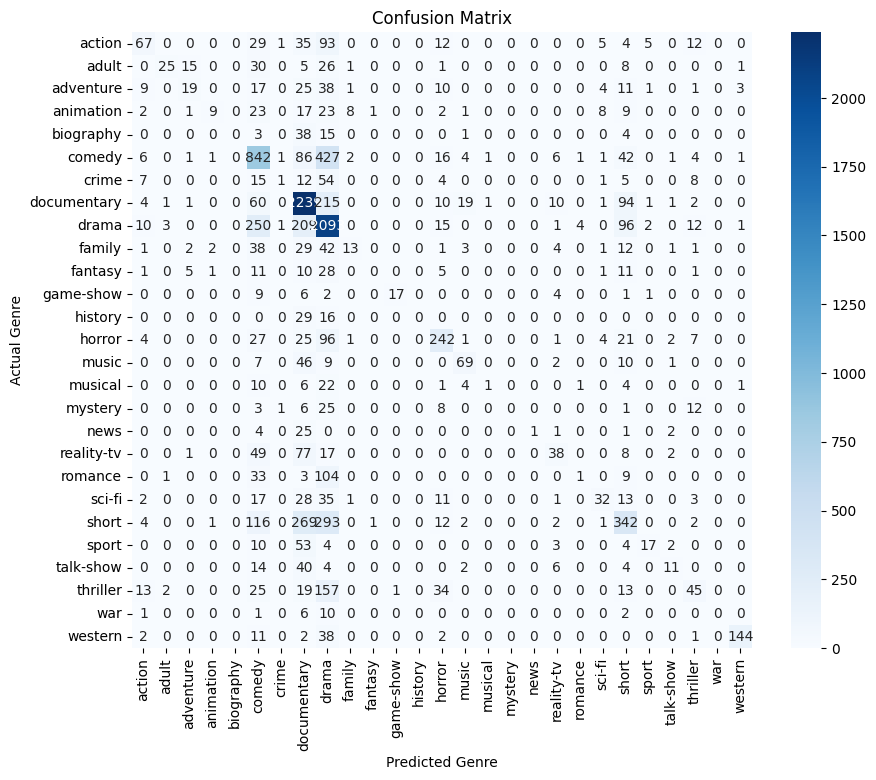

In [12]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score
import seaborn as sns

X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Train the model on the split data
model.fit(X_train_split, y_train_split)

# Make predictions on the validation set
y_val_pred = model.predict(X_val_split)

accuracy = accuracy_score(y_val_split, y_val_pred)
print(f"Validation Accuracy: {accuracy * 100:.2f}%")

conf_matrix = confusion_matrix(y_val_split, y_val_pred)

plt.figure(figsize=(10,8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=model.classes_, yticklabels=model.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Genre')
plt.ylabel('Actual Genre')
plt.show()

__7. Model Predictions on Test Data__

In [13]:
test_predictions = model.predict(X_test_tfidf)

test_data['GENRE'] = test_predictions

# Save the predictions
test_data[['ID', 'GENRE']].to_csv('test_data_predictions.csv', index=False)
print("Predictions saved to test_data_predictions.csv")

Predictions saved to test_data_predictions.csv


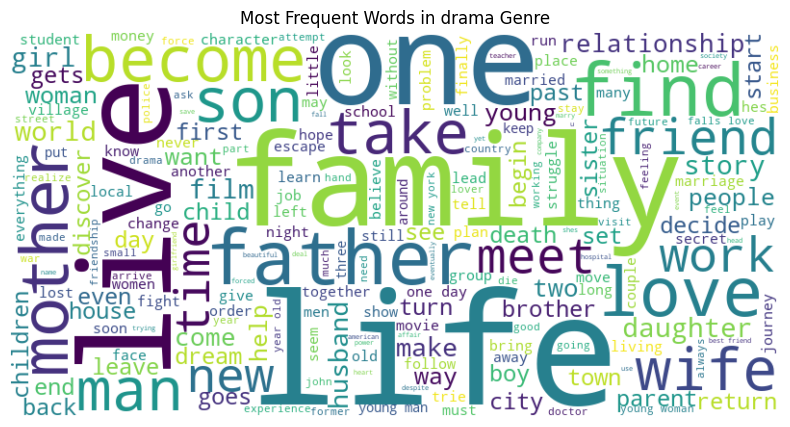

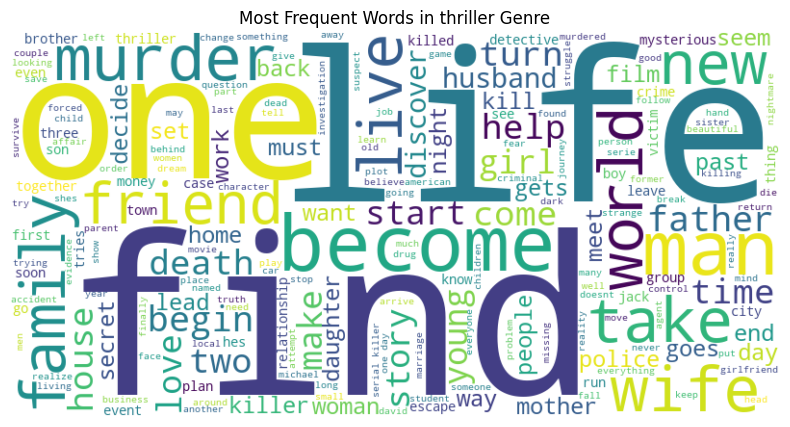

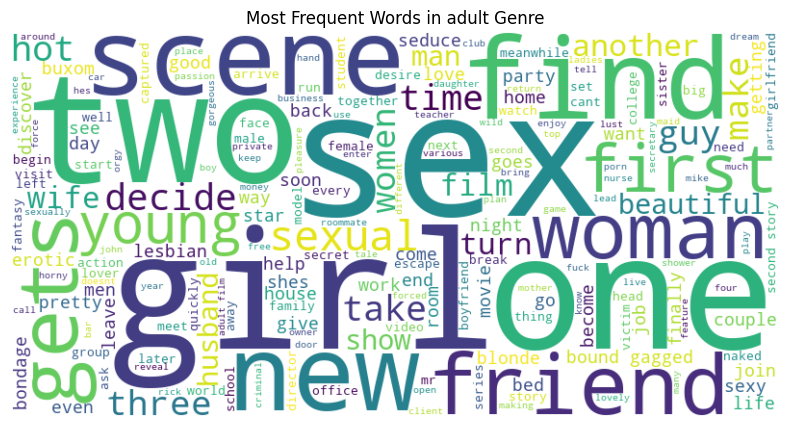

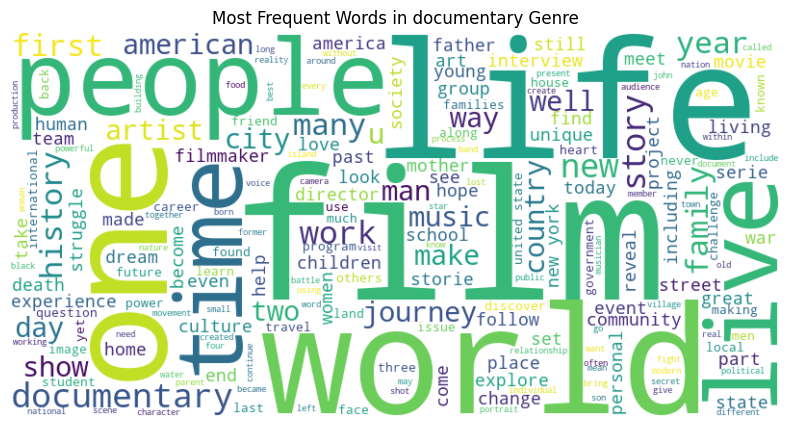

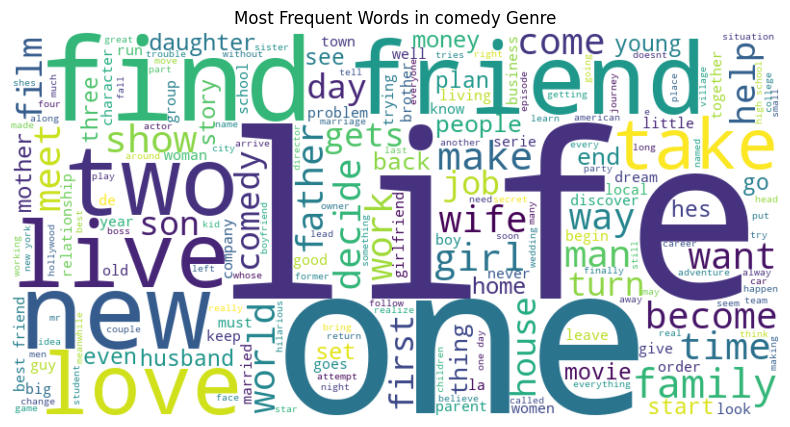

...

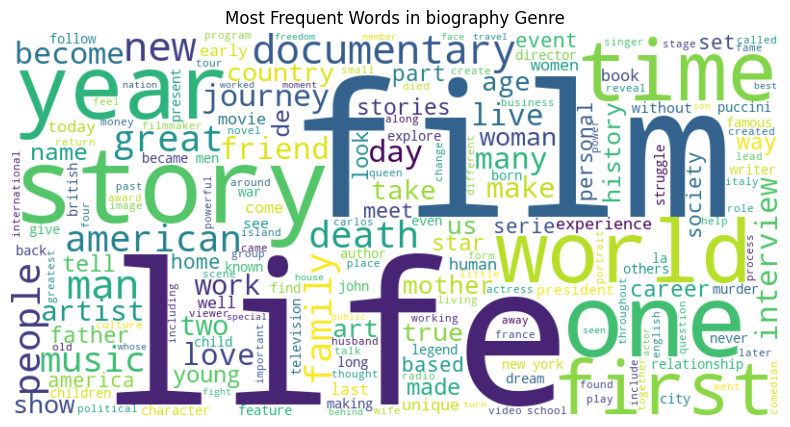

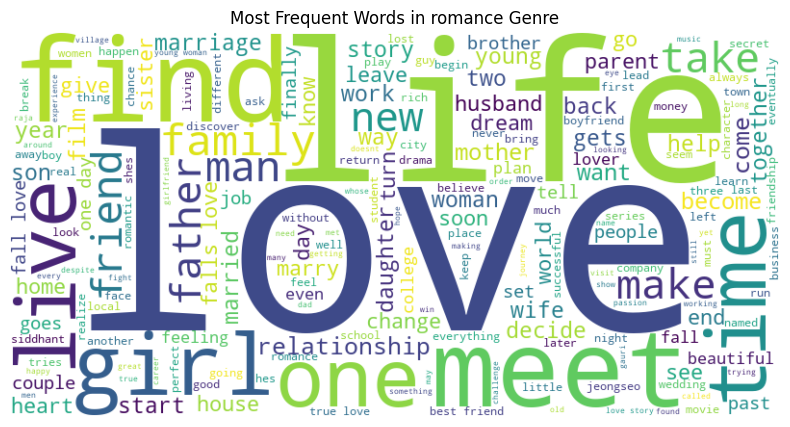

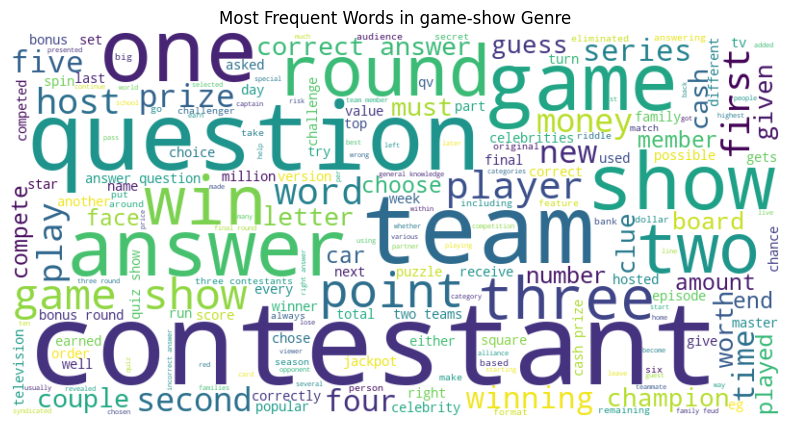

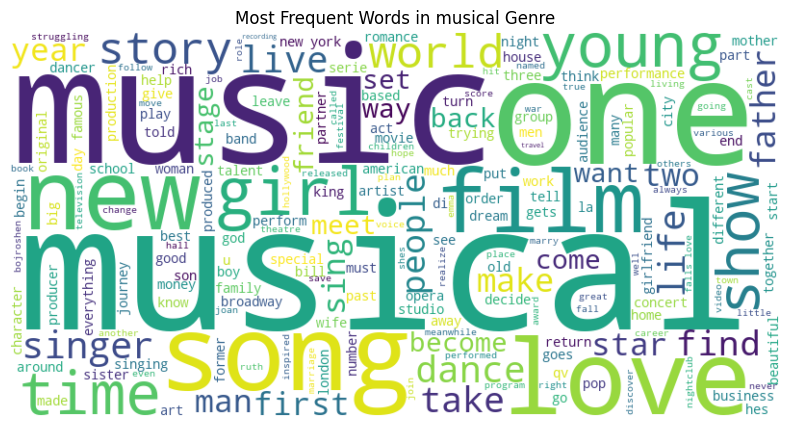

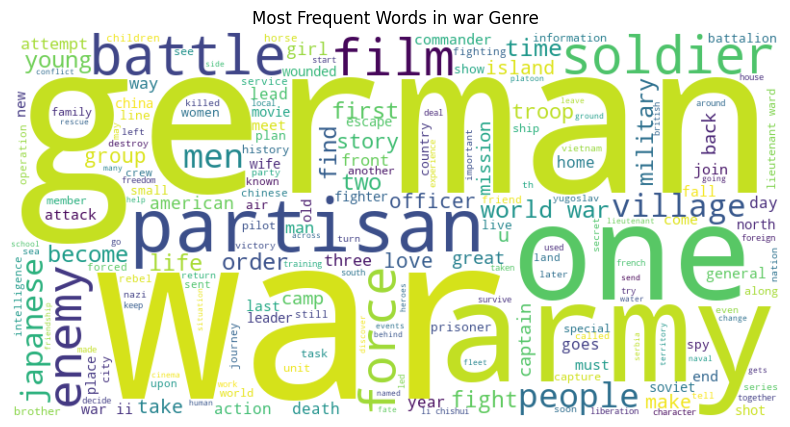

In [14]:
from wordcloud import WordCloud

# Create a word cloud for each genre
for genre in train_data['GENRE'].unique():
    genre_data = train_data[train_data['GENRE'] == genre]
    text = ' '.join(genre_data['DESCRIPTION'].values)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Most Frequent Words in {genre} Genre')
    plt.show()